# Рынок общественного питания Москвы

**Цели исследования**:
Представлен датасет с заведениями города Москвы с информацией представленной на лето 2022 года.  
Перед нами стоят следующие задачи: 
  1. Произвести первичный анализ данных: 
 - Провести изучение представленного датасета: изучить информацию представленную в столбцах датасета, количество представленных заведений, формат представленных значений;
- выполнить предобработку данных: привести значения к необходимым форматам, провести проверку на дубликаты, создать дополнительные столбцы с атрибутами данных;
- провети количественный анализ представленный категорий заведений;
- исследовать количество посадочных мест по категориям заведений;
- отобразить соотношение сетевых/несетеых заведений, проанализировать соотношение по категориям;
- найти 15 наиболее популярных сетей заведений в Москве. Проанализировать полученные результаты;
- изучить информацию о представленных административных районах и категории заведений размещенных в этих районах.
- пронализировать средние рейтинги заведений по категориям и административным районам, отобразить рейтинг на карте;
- отобразить все представленные заведения на карте Москвы;
- найти 15 улиц с наибольшим количеством заведений, проанализировать количество заведений и их категорию;
- рассчитать медиану среднего чека для различных административных районов, нанести медиану на карту, проанализировать результаты;
2. Детальный анализ заведений категории "Кофейня":
- проанализировать количество кофеен представленных в датасете, распредение их по административным районам;
- провети анализ круглосуточных кофеен;
- проанализировать рейтинги кофеен, распределение рейтингов по административным районам;
- рассчитать медиану средней цены чашки кофе.
- дать рекомендации на основе проведенного анализа по параметрам планируемого открытия новой кофейни.

**Описание данных**:

Файл с данными: moscow_places.csv:  

name — название заведения;  
address — адрес заведения;  
category — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
hours — информация о днях и часах работы;  
lat — широта географической точки, в которой находится заведение;  
lng — долгота географической точки, в которой находится заведение;  
rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего»;  
avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;  
middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
0 — заведение не является сетевым  
1 — заведение является сетевым  
district — административный район, в котором находится заведение, например Центральный административный округ;
seats — количество посадочных мест.  

### Предобработка данных 

#### Загрузка датасета и библиотек

In [1]:
import pandas as pd #импортируем pandas 

In [2]:
import matplotlib.pyplot as plt  #импортируем matplotlib

In [3]:
import seaborn as sns #импортируем seaborn 

In [4]:
from numpy import median #

In [5]:
from folium import Map, Choropleth, Marker # импортируем карту и хороплет

In [6]:
from plotly import graph_objects as go 

In [7]:
from folium.plugins import MarkerCluster

In [8]:
import plotly.express as px #импортируем ploty

#### Изучения датасета

Откроем и изучим датасет с заведениями города Москвы

In [9]:
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv') 
#загрузим датасет в data 

In [10]:
data.head(5) 
#выведим первые строки датасета

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [11]:
data.info() #просмотрим данные файла

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [12]:
data['seats'] = data['seats'].astype('Int64') 
#приведем значения столбца int

In [13]:
data['middle_avg_bill'] = data['middle_avg_bill'].astype('Int64') 
#приведем значения столбца middle_avg_bill к формату int 

In [14]:
data['middle_coffee_cup'] = data['middle_coffee_cup'].astype('Int64') 
#приведем значения столбца middle_coffe_cup к формату int

In [15]:
data['category'].value_counts() 
#посчитаем количество заведений по категориям

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Всего в датасете представлено 8 видов заведений.

Самые многочисленные заведения типов: 
    - кафе - 2378 и ресторан - 2043;  
    
Наименьшее количество заведений типа:
    - кафе - 256;

#### Предобработка данных

Проверим наличие явных дубликатов:

In [16]:
data.duplicated().sum() #рассчитаем количество явных дубликатов в датасете

0

Явные дубликаты в датасете отсутствуют 

Проверим наличие явных дубликатов после приведения содержная столбцов к нижнему регистру:

In [17]:
data['name'] = data['name'].str.lower() 
#приведем к нижнему регистру наименования

In [18]:
data['category'] = data['category'].str.lower()
#приведем к нижнему регистру категории

In [19]:
data['address'] = data['address'].str.lower()
#приведем к нижнему регистру адресы

In [20]:
data.duplicated().sum() #проверим еще раз на полные явные дубликаты

0

In [21]:
data.duplicated(subset = 'name').sum() 
#проеверим на явные дубликаты в имени

2894

Проверять на дубликаты в категории не имеет смысла, так как представлено всего 8 категорий заведений.

In [22]:
data.duplicated(subset = ['lat', 'lng'], keep = False).sum()
#рассчитаем количество дубликаов по координатам

66

Выведим дубликаты по географическим координатам:

In [23]:
data[data.duplicated(subset = ['lat', 'lng'], keep = False) == True]
#выведим дубликаты по координатам

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
121,встреча,кафе,"москва, карельский бульвар, 4а",Северный административный округ,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,<NA>,<NA>,1,<NA>
182,карелия,кафе,"москва, карельский бульвар, 4а",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,<NA>,<NA>,0,<NA>
271,алали,быстрое питание,"москва, староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.875804,37.665551,4.2,NaN,NaN,<NA>,<NA>,0,100
273,pho oanh,кафе,"москва, староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 11:00–21:30",55.875804,37.665551,4.0,NaN,NaN,<NA>,<NA>,1,100
348,meat лав,ресторан,"москва, головинское шоссе, 10б",Северный административный округ,"ежедневно, 11:00–23:00",55.837181,37.497324,5.0,средние,Средний счёт:300–600 ₽,450,<NA>,0,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7787,тануки,ресторан,"москва, липецкая улица, 2, корп. 8",Южный административный округ,"ежедневно, 10:00–05:00",55.608307,37.664941,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250,<NA>,1,120
8019,пицца кофе,пиццерия,"москва, улица вавилова, 66",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.683046,37.549310,4.2,NaN,NaN,<NA>,<NA>,0,80
8086,кулинарная школа ginza project,кафе,"москва, мытная улица, 74",Южный административный округ,"ежедневно, 09:00–21:00",55.712117,37.620555,4.5,средние,Средний счёт:500–1000 ₽,750,<NA>,0,92
8095,белочка,ресторан,"москва, улица ленинская слобода, 19",Южный административный округ,пн-пт 12:00–17:00,55.708354,37.652705,3.4,NaN,NaN,<NA>,<NA>,0,450


Дубликаты имееют одинковый адрес и соответственно близкое географическое расположение. Эти явные дубликаты оставим как есть.

Проверим явные дубликаты при совпадении имени и адреса:

In [24]:
data.duplicated(subset = ['name', 'address'], keep = False).sum() 
# найдем такое количество явных дубликтов

8

In [25]:
data[data.duplicated(subset = ['name', 'address'], keep = False) == True] 
#выведим строки с дубликатами 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,<NA>,<NA>,0,<NA>
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,<NA>,<NA>,0,<NA>
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,<NA>,<NA>,0,188
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,<NA>,<NA>,1,188
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,<NA>,<NA>,0,150
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,<NA>,<NA>,1,150
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,<NA>,<NA>,1,276
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,<NA>,<NA>,0,276


In [26]:
data = data.drop_duplicates(subset=['name', 'address'], keep = 'first') 
#удалим явные дубликты

In [27]:
data.isna().sum() #рассчитаем количество пропусков в датасете

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Возможности устранить достоверно устранить пропуски нет. Оставим пропуски как есть.

Пропуски представлены в следующих сталбцах: 

    1. hours - пропуски возникли вероятно из-за отсутвия информации о часах работы заведения. Восстановить пропуски исходя  
    из данных невозможно.
    2. price - пропуски, вероятно возникли при обработке столбца middle_avg_bill, что в свою очередь вызвано недостатком данных в столбце avg_bill.
    3. avg_bill - вызваны, вероятно, отсутствием информации о среднем чеке или других данных о расходах посетителей. 
    4. middle_avg_bill - пропуски вызваны отсутвием информации о срднем чеке в столбце avg_bill;
    5. middle_coffee_cup - пропуски присутствуют из-за отсутствия данных о средней цене чашки кофе
    6. Данные количестве мест, вероятно отсутствуют из за отсутвия данных.

создадим столбец с наименованиями улиц

In [28]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия'] #создадим список тиовых слов 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words)) #выделим наименования улиц

data['street'] = data['address'].str.extract(str_pat) #создадим стобец с наименованием улиц

Создадим столбец с булевыми значениями is_24/7 для заведений которые работают круглосуточно и ежедневно.

In [29]:
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно') #создадим столбец с булевыми значениеми
#для круглосуточных заведений

#### Вывод:
- В датасете представлена информация о заведениях города Москвы. Данные содержат описание следующих типов заведений:  
кафе, ресторан, кофейня, бар,паб, пиццерия, быстрое питание, столовая, булочная;  
- Соответственно количество заведений по категориям: 
кафе               -2378  
ресторан           -2043  
кофейня            -1413  
бар,паб             -765  
пиццерия            -633  
быстрое питание     -603  
столовая            -315  
булочная            -256  
- Датасет содержит следующую информацию об указанных заведениях:
каетгорию заведения;    
адрес;    
район;  
часы работы;  
географическую широту заведения;  
географическую долготу заведения;  
рейтинг посетителей;  
ценовую категорию;  
диапазон среднего чека;  
средний чек;  
средняя цена чашки кофе;  
сетевое/несетевое заведение;  
количество мест в заведении;
- В данных явные дубликаты отсутствуют;
- Значения в middle_avg_bill, middle_coffe_cup и seats были приведены к целочисленному значению.
- пропуски значений присутствуют в стобцах: 
hours, price, avg_bill, middle_coffee_cup, seats.
- Добавлены столбцы с наименованием улицы на которой расположены заведения, и признак круглосуточной работы заведения. 

### Анализ данных 

#### Анализ  заведений

Рассмотрим представленные типы заведений в датасете, а так же их количество по категориям: 

In [30]:
f'в датасете представлены следующие категории заведений: {data["category"].unique()}'# выведим уникальные значения категорий

"в датасете представлены следующие категории заведений: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'\n 'булочная' 'столовая']"

##### Анализ категорий заведений

Рассчитаем и построим график количества заведений в зависимости от категории:

In [31]:
quantity = data.groupby('category', as_index = False)\
.agg('count') \
.sort_values(by = 'name', ascending = False)

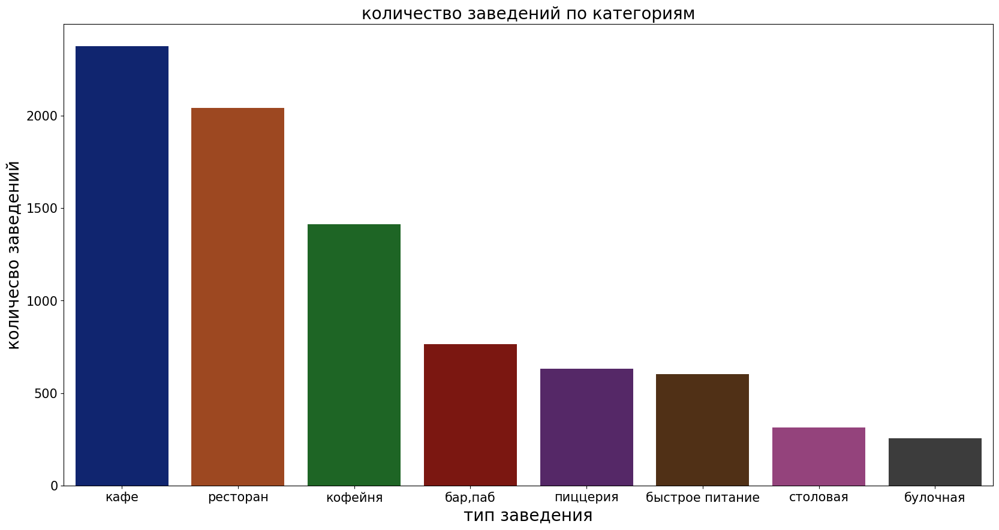

In [32]:
plt.figure(figsize = (20,10))
plt.rcParams.update({'font.size': 15})#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(x = 'category', y = 'name', data = quantity)#построим столбчатую диаграмму
plt.title('количество заведений по категориям', fontsize = 20) #установим наименование графика 
plt.xlabel("тип заведения", fontsize = 20) #установим наименование оси x
plt.ylabel("количесво заведений", fontsize = 20) #установим наименование оси y
plt.show;

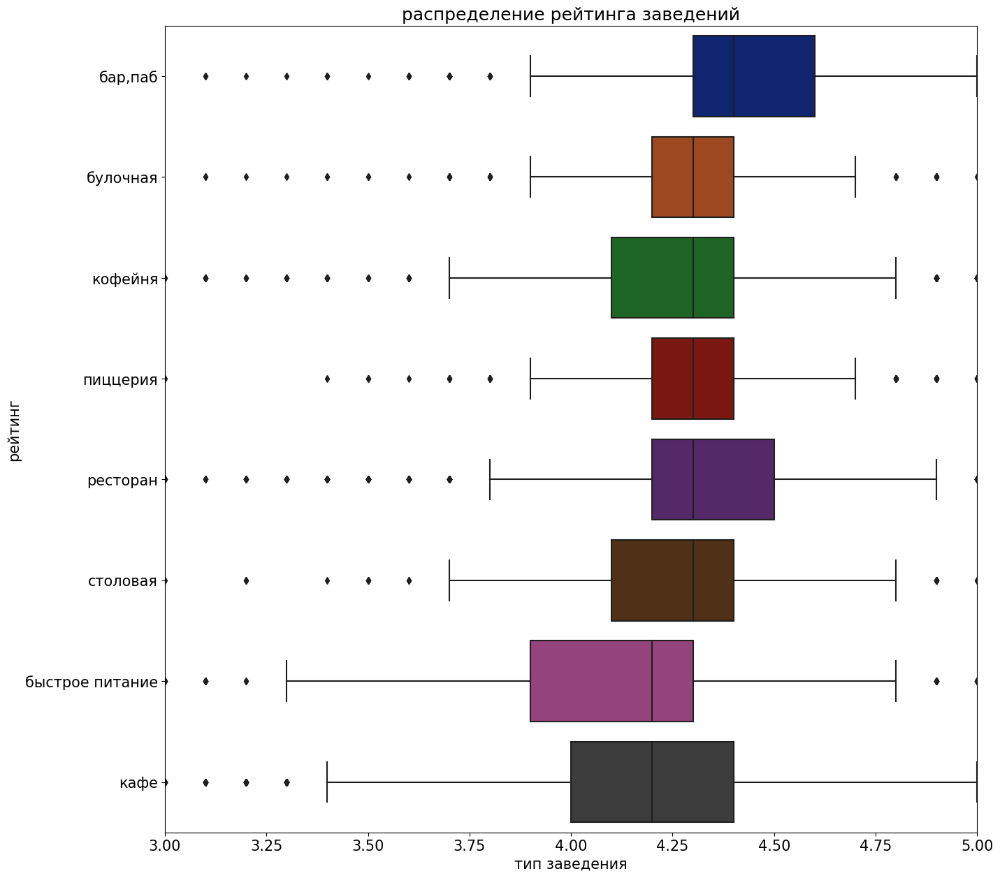

In [33]:
plt.figure(figsize = (15,15))
axes = plt.axes()
axes.set_xlim([3, 5])
sns.boxplot(x='rating', y='category', data=data, orient = 'h',
order=data.groupby('category')['rating'].agg('median').sort_values(ascending=False).index)
plt.title('распределение рейтинга заведений') #установим наименование графика 
plt.xlabel("тип заведения") #установим наименование оси x
plt.ylabel("рейтинг") #установим наименование оси y
plt.show()


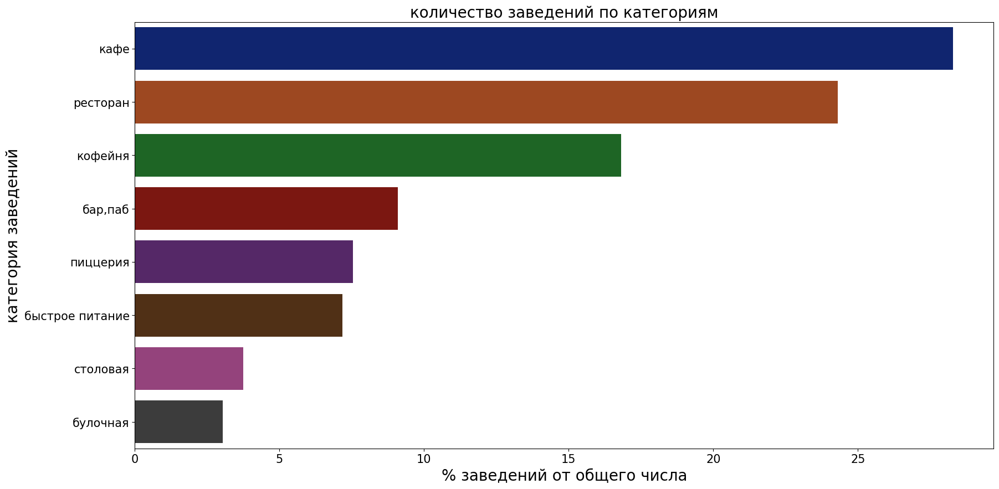

In [34]:
plt.figure(figsize = (20,10))
plt.rcParams.update({'font.size': 15})#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(y = quantity['category'], x = quantity['name']*100/quantity['name'].sum(), orient = 'h',)#построим столбчатую диаграмму
plt.title('количество заведений по категориям', fontsize = 20) #установим наименование графика 
plt.xlabel("% заведений от общего числа", fontsize = 20) #установим наименование оси x
plt.ylabel('категория заведений', fontsize = 20) #установим наименование оси y
plt.show;

Вывод:
    Наибольшее количество заведений типа кафе > 2000(28% от общего числа) и ресторанов > 2000 (24% от общего числа)
    Наименьшее количестов заведений типа столовая < 500(4% от общего числа) и булочная < 500 (3% от общего числа)

##### Анализ количества посадочных мест

Проведем анализ посадочных мест по категориям заведений: 

In [35]:
seats_sum = data.groupby('category', as_index = False) \
.agg({'seats':'sum'})\
.sort_values(by = 'seats',ascending = False)
seats_sum #выведим таблицу

,category,seats
6,ресторан,154681
3,кафе,118494
4,кофейня,83511
0,"бар,паб",58131
5,пиццерия,40350
2,быстрое питание,34513
7,столовая,16359
1,булочная,13229


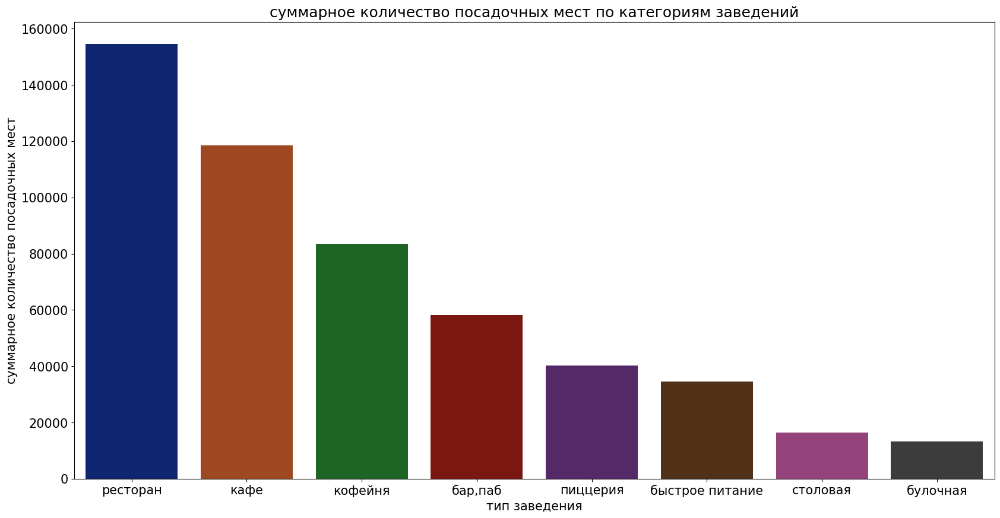

In [36]:
plt.figure(figsize = (20,10))#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(x = 'category', y = 'seats', data = seats_sum)#построим столбчатую диаграмму
plt.title('суммарное количество посадочных мест по категориям заведений') #установим наименование графика 
plt.xlabel("тип заведения") #установим наименование оси x
plt.ylabel("суммарное количество посадочных мест") #установим наименование оси y
plt.show;

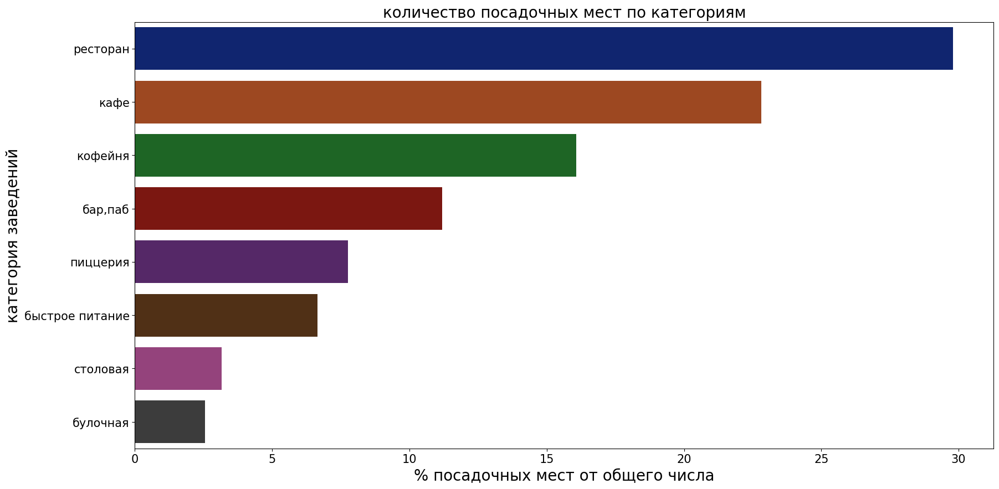

In [37]:
plt.figure(figsize = (20,10))
plt.rcParams.update({'font.size': 15})#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(y = seats_sum['category'], x = seats_sum['seats']*100/seats_sum['seats'].sum(), orient = 'h',)#построим столбчатую диаграмму
plt.title('количество посадочных мест по категориям', fontsize = 20) #установим наименование графика 
plt.xlabel("% посадочных мест от общего числа", fontsize = 20) #установим наименование оси x
plt.ylabel('категория заведений', fontsize = 20) #установим наименование оси y
plt.show;

Вывод:   
    - наибольшее количество сумманрно мест у ресторанов ~155000 (30% от общего количества посадочных мест)  
    - далее идут кафе с ~ 119 000 посадочных мест (23% от общего количества мест)  
    - на третьем месте расположены кофейни с ~ 84000 (16% от общего количества)  
    - наименьшее суммарное количество посадочных мест у столоых и булочных с ~ 16300 (3%) и ~ 13200 (3%)  

Рассчитаем среднее количество посадочных мест в заведениях:

In [38]:
seats_mean = data.groupby('category', as_index = False) \
.agg({'seats':'mean'}) \
.sort_values(by = 'seats', ascending = False) 
seats_mean #выведим значения

,category,seats
0,"бар,паб",124.477516
6,ресторан,121.892041
4,кофейня,111.199734
7,столовая,99.75
2,быстрое питание,98.891117
3,кафе,97.365653
5,пиццерия,94.496487
1,булочная,89.385135


Построим график среднего количества мест в заведениях

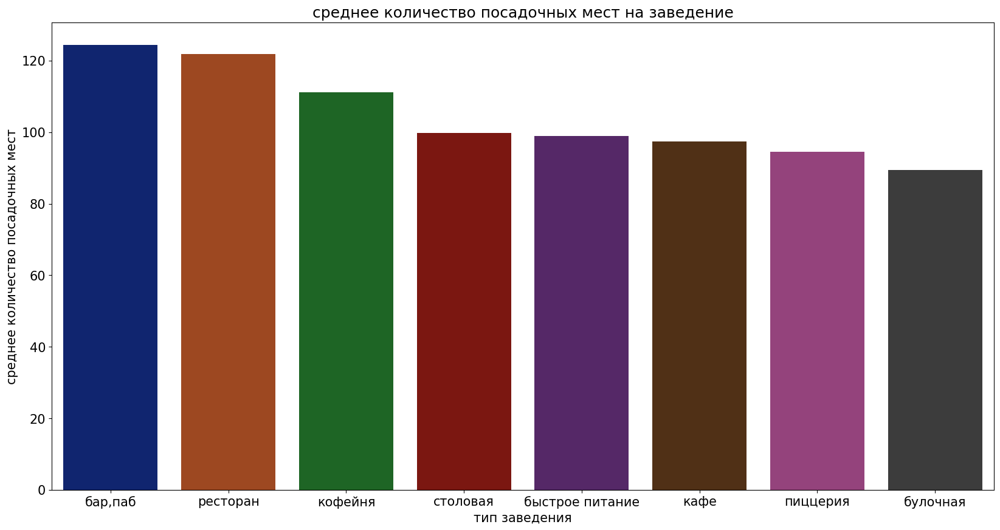

In [39]:
plt.figure(figsize = (20,10))#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(x = 'category', y = 'seats', data = seats_mean)#построим столбчатую диаграмму
plt.title('среднее количество посадочных мест на заведение') #установим наименование графика 
plt.xlabel("тип заведения") #установим наименование оси x
plt.ylabel("среднее количество посадочных мест") #установим наименование оси y
plt.show;

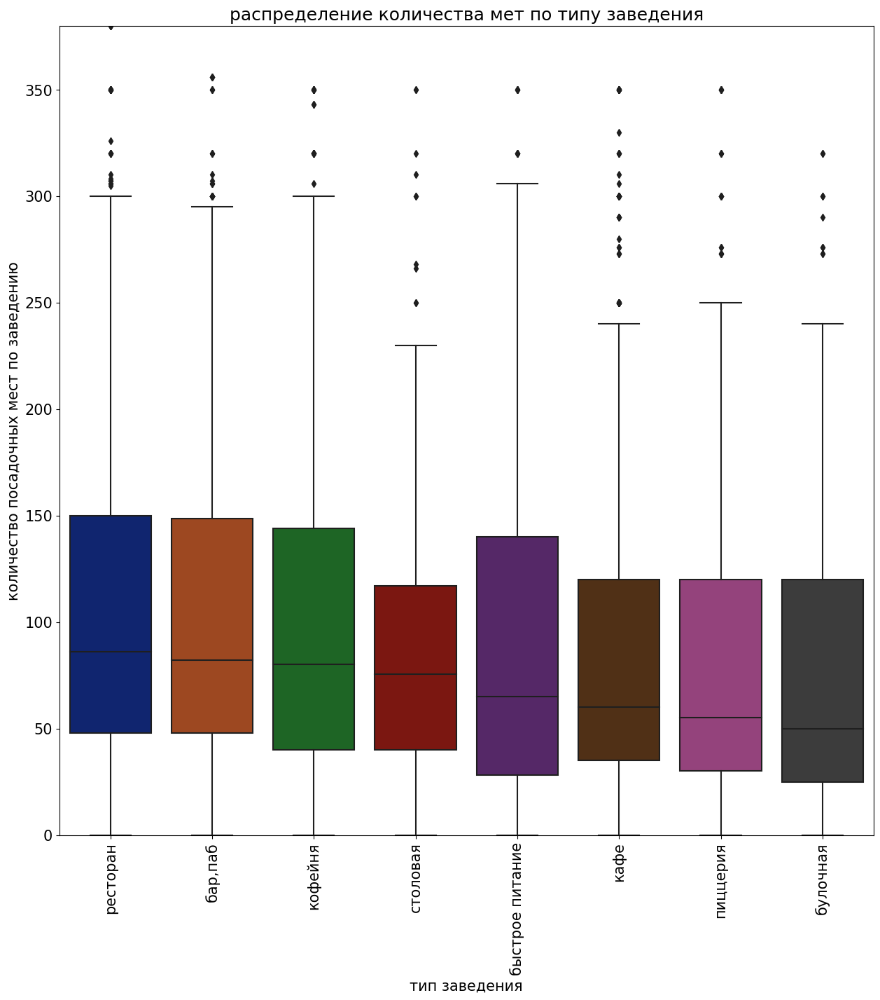

In [40]:
plt.figure(figsize = (15,15))
axes = plt.axes()
axes.set_ylim([0, 380])
sns.boxplot(x='category', y='seats', data=data, 
order=data.groupby('category')['seats'].agg('median').sort_values(ascending=False).index)
plt.title('распределение количества мет по типу заведения') #установим наименование графика 
plt.xlabel("тип заведения") #установим наименование оси x
plt.ylabel("количество посадочных мест по заведению") #установим наименование оси y
plt.xticks(rotation=90)
plt.show()


**Вывод**:
 - средние значения количества посадочных мест находятся в диапазоне от 120 до 90 посадочных мест для всех категорий(наибольшее количество у ресторанов ~120, наименьшое у столовых ~90);
 - медианные значения посадочных мест лежат в диапазоне от 50 до 100 для всех категорий заведений. Количество посадочных мест для всех категорий заведений более 250 - 300 крайне малочислено.

##### Анализ сетевых, несетвых заведений.

Проведем анализ сетевых и несетвых заведений:

In [41]:
chain_quantity = data.groupby('chain', as_index = False) \
.agg({'name':'count'}).replace({0:'несетевые', 1:'сетевые'}) #переименуем строки

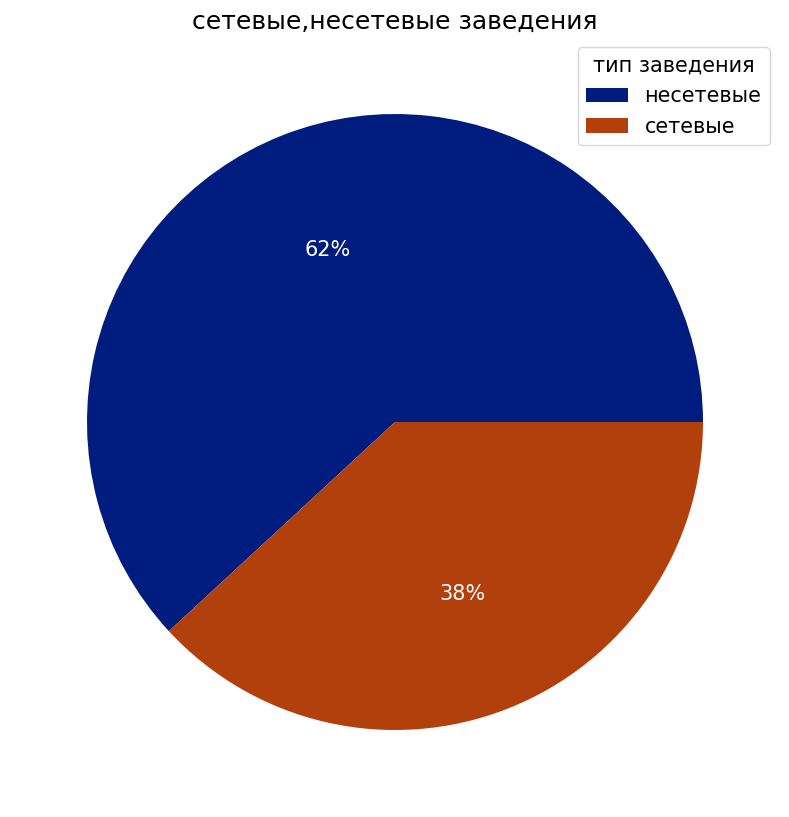

In [42]:
plt.figure(figsize = (15,10))#зададим размер графика 
sns.set_palette('dark') #выберим стиль графика
plt.pie(chain_quantity['name'], autopct='%.0f%%',textprops={'color':"w"}) #построим курговую диаграмму
plt.legend(labels = chain_quantity['chain'], title="тип заведения") #установим легенду графика
plt.title('сетевые,несетевые заведения')#установим название графика
plt.show;

Вывод: Несетевых заведении представлено больше(62%), чем сетевых(38%).

Рассмотрим долю сетевых заведений:

In [43]:
category_chain = data.groupby(['chain', 'category'], as_index = False) \
.agg({'name':'count'}) \
.sort_values(by = 'name', ascending = False) \
.replace({0:'несетевые', 1:'сетевые'})
chain = category_chain.query('chain == "сетевые"')
chain = chain.sort_values(by = 'category', ascending = False)

In [44]:
chain['ratio'] = round(chain['name']*100/category_chain.groupby('category')['name'].transform('sum'))
chain = chain.sort_values(by = 'ratio', ascending = False)

In [45]:
fig = px.bar(chain, x='category', 
                             y='ratio', 
                             title='Доля сетевых заведений',  
                             text =  'ratio',
                             labels={
                                    'ratio':'доля, %',
                                    'category':'категория заведений'})#построим столбчатый график

fig.show() 

**Вывод**:      
Больше всего сетевых заведений в категории булочная, меньше всего в категории бар, паб 

##### Анализ более ТОП-15 сетевых заведений:

Проанализируем сетевые заведения 

In [46]:
chain_name = data.query('chain == 1') #выделим сетевые заведения 
chain_name_15 = chain_name.groupby(['name', 'category'], as_index = False) \
.agg({'address':'count'}) \
.sort_values(by = 'address', ascending = False) \
.rename(columns = {'name':'chain', 'address':'quantity'}) \
.head(15)#отберем первые 15 значений
chain_name_15 #выведим первые 15 заведений

,chain,category,quantity
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


In [47]:
fig = px.bar(chain_name_15, x='chain', 
                             y='quantity', 
                             color = 'category', title='ТОП 15 сетей по количеству и категориям',  barmode='group',
                             labels={"chain": "наименование сети",
                                    'quantity':'количество',
                                    'category':'категория заведений'}) #постороим график по количеству заведений 
fig.show() 

- Среди ТОП-15 сетей представлены следующие категории:
    кофейня, пицерия, ресторан, кафе, булочная.
- Наибольшее количество сетей относится к категории кофеен (5). Далее идут кафе(3) и рестораны (3). Затем пиццерии (2) и булочная(1)


Рассчитаем отношение  категорий ТОП 15 заведений к их общему числу:

In [48]:
 chain_name_15_category = chain_name_15.groupby('category', as_index = False).agg({'quantity':'sum'})
chain_name_15_category['ratio'] = round(chain_name_15_category['quantity']*100/chain_name_15_category['quantity'].sum())
chain_name_15_category = chain_name_15_category.sort_values(by = 'ratio', ascending = False)
chain_name_15_category

,category,quantity,ratio
2,кофейня,350,46.0
3,пиццерия,150,20.0
4,ресторан,154,20.0
1,кафе,89,12.0
0,булочная,25,3.0


Построим график отношения: 

In [49]:
fig = px.bar(chain_name_15_category, x='category', 
                             y='ratio', 
                             title='% категорий популярных сетей',  
                             text =  'ratio',
                             labels={
                                    'ratio':'доля, %',
                                    'category':'категория заведений'})#построим столбчатый график

fig.show() 

Среди популярных сетевых заведений преобладают кофейни, наименее популярны булочные.

In [50]:
# check
chain_name = data.query('chain == 1') #выделим сетевые заведения 
chain_name_15 = chain_name.groupby(['name'], as_index = False) \
.agg({'address':'count'}) \
.sort_values(by = 'address', ascending = False) \
.rename(columns = {'address':'quantity'}) \
.head(15)#отберем первые 15 значений

name__of_15 = chain_name_15['name'].unique()
chain_15 = data.query('chain == 1').query('name in @name__of_15')
chain_15.groupby(['category']).agg(count_object=('name', 'count')).sort_values(by=['count_object'])

,count_object
category,
столовая,2
"бар,паб",4
быстрое питание,12
булочная,25
кафе,100
пиццерия,151
ресторан,186
кофейня,336


##### Анализ заведений по административным районам

Проведем анализ заведений по административным районам:

In [51]:
regions = list(data['district'].unique())
f'Следующие административные районы представлены в датасете:{regions}'

"Следующие административные районы представлены в датасете:['Северный административный округ', 'Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ', 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ']"

В датасете представлены все административные районы Москвы.

Рассчитаем количество заведений по административным районам

In [52]:
region_quantity= data.groupby('district', as_index = False) \
.agg({'name':'count'}) \
.sort_values(by = 'name', ascending = False)
region_quantity #выведим данные

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,898
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


Построим диаграмму распрделения заведений по административным районам:

Лидирует по количеству заведений Центральный административный округ Москвы ~ 2400 (27% от общего количества заведений)  
На последнем месте находится Северо-Западный административный округ ~ 400 (5% от общего количества заведений) 

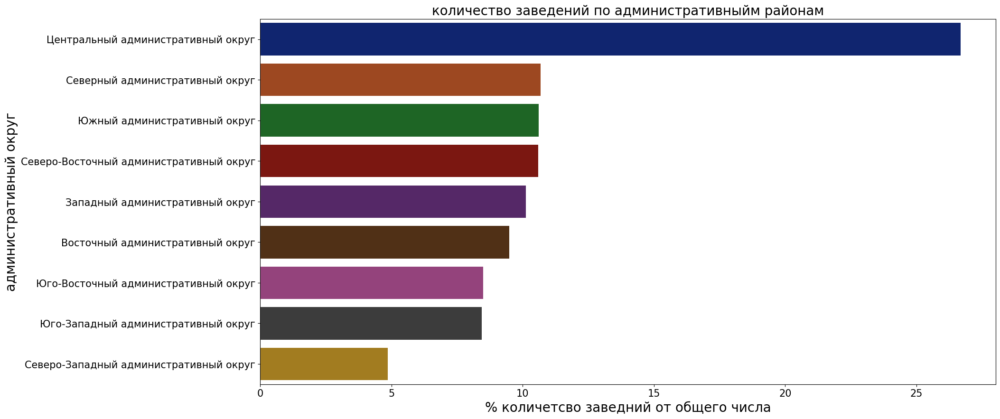

In [53]:
plt.figure(figsize = (20,10))
plt.rcParams.update({'font.size': 15})#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(y = region_quantity['district'], x = region_quantity['name']*100/region_quantity['name'].sum(), orient = 'h',)#построим столбчатую диаграмму
plt.title('количество заведений по административныйм районам', fontsize = 20) #установим наименование графика 
plt.xlabel("% количетсво заведний от общего числа", fontsize = 20) #установим наименование оси x
plt.ylabel('административный округ', fontsize = 20) #установим наименование оси y
plt.show;

In [54]:
district_group = data.groupby(['district', 'category'], as_index = False).agg({'name':'count'})

In [55]:
fig = px.bar(district_group, x='name', 
                             y='district', 
                             color = 'category', title='распределение по категориям и районам',
                             labels={"name": "количество заведений",
                                    'district':'район',
                                    'category':'категория заведений'},
                             width=1000, height=1000,
                             text =  'name',
                             orientation = 'h')
fig.update_layout(yaxis={'categoryorder':'total ascending'})#построим график по количеству заведений
fig.show() 

Вывод: 
В центральном административном округе лидирует категория бар, паб.
В Северо-Западном, Западном, Восточном, Юго-Восточном, Юго-Западном, Южном административном округе лидирует категория ресторанов В Северном и Северо-Восточном административном округе лидирует категория кофейняю.
Во всех административных округах кроме Юго-Западного административного округа на последнем месте находится категория булочная. Только в Юго-Западном административном округе на последнем месте категория столовая.

##### Анализ рейтинга заведений

Рассчитаем медианный рейтинг заведений по категориям

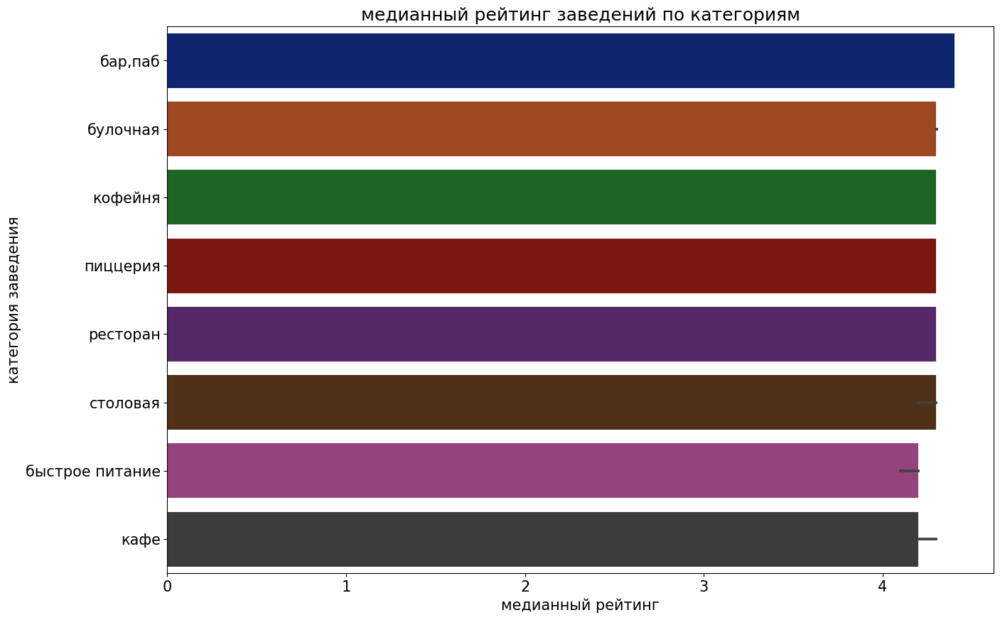

In [56]:
plt.figure(figsize = (15,10))
sns.barplot(x='rating', y='category', data=data.sort_values(by = 'rating', ascending = False), estimator = median,
           orientation = 'horizontal',
           order=data.groupby('category')['rating'].agg('median').sort_values(ascending=False).index)
plt.title('медианный рейтинг заведений по категориям') #установим наименование графика 
plt.xlabel("медианный рейтинг") #установим наименование оси x
plt.ylabel("категория заведения") #установим наименование оси y
plt.show()

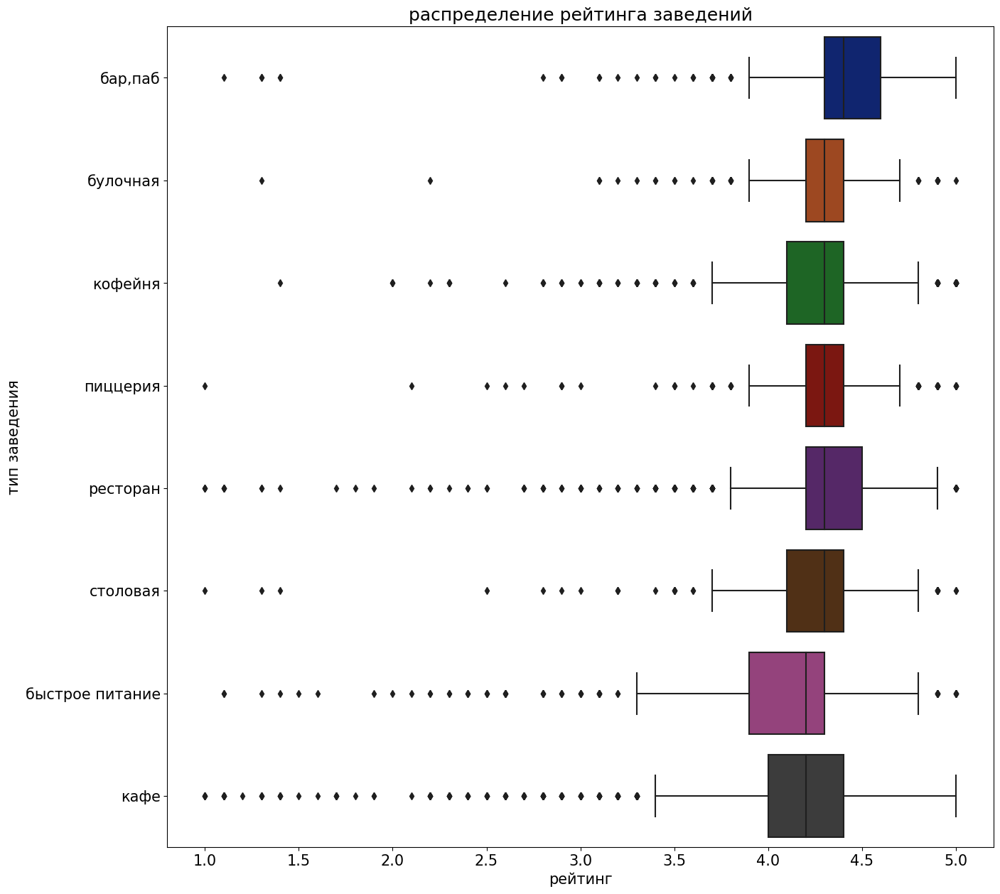

In [57]:
plt.figure(figsize = (15,15))
sns.boxplot(x='rating', y='category', data=data, orient = 'h',
order=data.groupby('category')['rating'].agg('median').sort_values(ascending=False).index)
plt.title('распределение рейтинга заведений') #установим наименование графика 
plt.xlabel("рейтинг") #установим наименование оси x
plt.ylabel("тип заведения") #установим наименование оси y
plt.show()


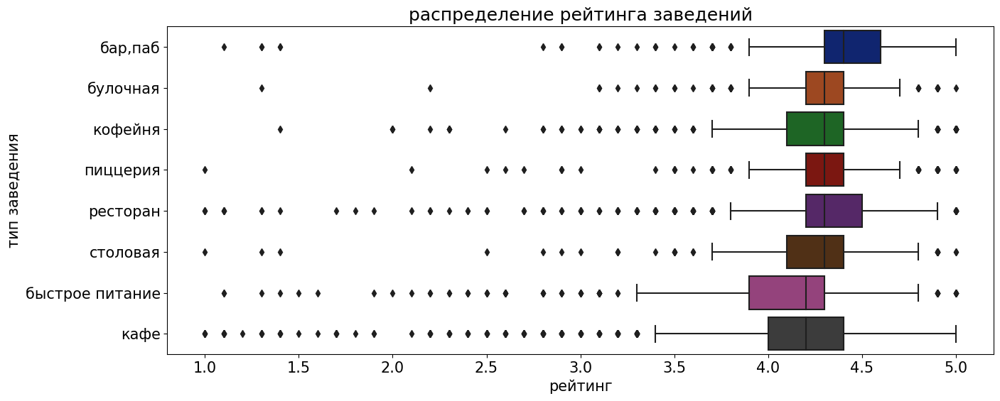

In [58]:
# check

plt.figure(figsize = (15,6))
sns.boxplot(x='rating', y='category', data=data, orient = 'h',
order=data.groupby('category')['rating'].agg('median').sort_values(ascending=False).index)
plt.title('распределение рейтинга заведений') #установим наименование графика 
plt.xlabel("рейтинг") #установим наименование оси x
plt.ylabel("тип заведения") #установим наименование оси y
plt.show()


**Вывод**: 
Медианный рейтинг всех категорий заведений примерно одинаков и лежит в диапазоне от 4 до 4.5.

Проанализируем медианные рейтинги  на карте

In [59]:
rating_median = data.groupby('district', as_index=False).agg({'rating':'median'})
rating_median

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [60]:
moscow_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
map_moscow_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_geo,
    data=rating_median,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(map_moscow_rating)
map_moscow_rating

**Вывод**: Наивысшие рейтинги у заведений Центрального административного округа.  Наименьшие рейтинги у заведений Северного и Юго-Восточного административного округа.

#### Геоаналитика 

#### Отображение заведений на карте 

Отобразим все заведения Москвы на карте:

In [61]:
map_moscow =  Map(location=[moscow_lat, moscow_lng], zoom_start=10) #созадим карту москвы

In [62]:
mark_cluster = MarkerCluster().add_to(map_moscow) #добавим кластер маркеров

In [63]:
def create_markers(row): #создадим функцию для добавления маркеров на карту
    Marker([row['lat'], row['lng']], #добавим широту и долготу в кластер
    popup =f"{row['name']}0, {row['category']}", #добавим имена и категорию заведений в кластер
    ).add_to(mark_cluster) #добавим кластер на карту москвы

In [64]:
data.apply(create_markers, axis = 1)#применим функцию

0       None
1       None
2       None
3       None
4       None
        ... 
8401    None
8402    None
8403    None
8404    None
8405    None
Length: 8402, dtype: object

In [65]:
map_moscow #выведим карту 

#### Анализ заведений по улицам 

Найдем 15 улиц с наибольшим количеством заведений

In [66]:
street_top15 = data.groupby(['street'], as_index = False) \
.agg({'rating':'count'}) \
.sort_values(by = 'rating', ascending = False) \
.head(15)
street_top15 #выедим список улиц

,street,rating
778,проспект мира,183
782,профсоюзная улица,122
775,проспект вернадского,108
508,ленинский проспект,107
506,ленинградский проспект,95
360,дмитровское шоссе,88
441,каширское шоссе,77
291,варшавское шоссе,75
507,ленинградское шоссе,69
527,люблинская улица,60


In [67]:
streets = list(street_top15['street']) #создадим список из названий улиц

In [68]:
top_streets = data.query('street in @streets') 
#выберим информацию о заведениях находящихся на этих улицах

In [69]:
top_streets_sum = top_streets.groupby(['street', 'category'], as_index = False) \
.agg({'name':'count'}) \
.sort_values(by = 'name', ascending = False)

In [70]:
top_streets_sum

,street,category,name
80,проспект мира,кафе,53
83,проспект мира,ресторан,45
81,проспект мира,кофейня,36
88,профсоюзная улица,кафе,35
75,проспект вернадского,ресторан,33
...,...,...,...
31,кутузовский проспект,булочная,1
7,алтуфьевское шоссе,столовая,1
1,алтуфьевское шоссе,булочная,1
70,проспект вернадского,булочная,1


In [71]:
fig = px.bar(top_streets_sum, x='name', 
                             y='street', 
                             color = 'category', title='топ 15 улиц по количеству заведений',
                             text = 'name',
                              orientation = 'h',
                              labels={"name": "количество заведений",
                                    'street':'улица',
                                    'category':'категория заведений'},
                             width=1000, height=1000) #построим график по количеству заведений
fig.update_layout(yaxis={'categoryorder':'total ascending'}) #отсортируем значения
fig.show() 

Вывод: Наибольшее количество заведений находится на Проспекте Мира. В лидерах на самых популярных улицах находятся кафе и кофейни.

#### Анализ улиц с одним заведением

Отберем улицы с одним заведением находящимся на них:

In [72]:
streets_one = data['street'].value_counts().reset_index() #посчитаем количество заведений на улице
streets_one.columns = ['street', 'count_ent'] #переименуем колонки
streets_one = streets_one[streets_one['count_ent'] == 1] #выделим улицы с 1 заведением
streets = list(streets_one['street']) #создадим список
one_enterpr = data.query('street in @streets') #отберем информацию из исходного датафрейма

In [73]:
one_category = one_enterpr.groupby('category', as_index = False) \
.agg({'name':'count'}) \
.sort_values(by = 'name', ascending = False) #сгрупируем по категории заведений

In [74]:
one_category# выведим информацию

,category,name
3,кафе,137
6,ресторан,88
4,кофейня,73
0,"бар,паб",40
7,столовая,36
2,быстрое питание,17
5,пиццерия,14
1,булочная,9


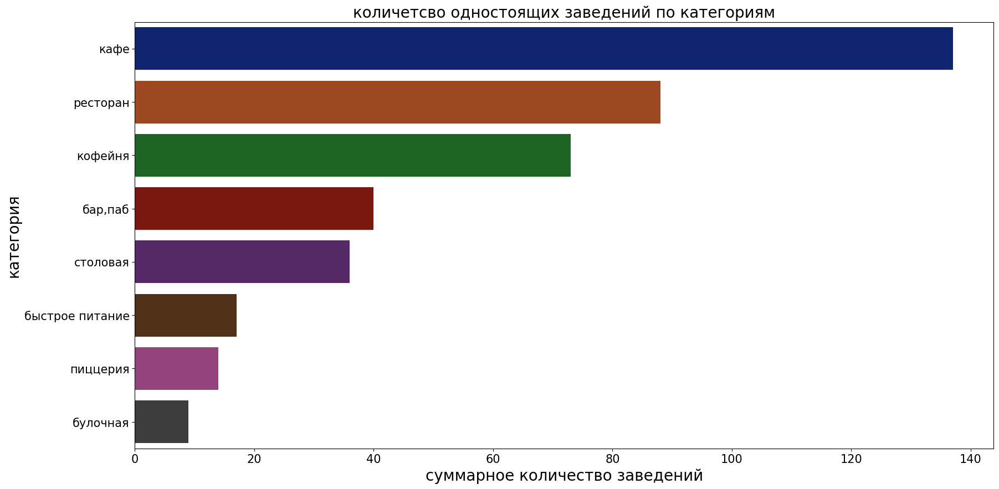

In [75]:
plt.figure(figsize = (20,10))
plt.rcParams.update({'font.size': 15})#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(y = one_category['category'], x = one_category['name'], orient = 'h',)#построим столбчатую диаграмму
plt.title('количетсво одностоящих заведений по категориям', fontsize = 20) #установим наименование графика 
plt.xlabel("суммарное количество заведений", fontsize = 20) #установим наименование оси x
plt.ylabel('категория', fontsize = 20) #установим наименование оси y
plt.show;

In [76]:
one_category = one_enterpr.groupby('district', as_index = False) \
.agg({'name':'count'}) \
.sort_values(by = 'name', ascending = False) #сгрупируем информацию по району

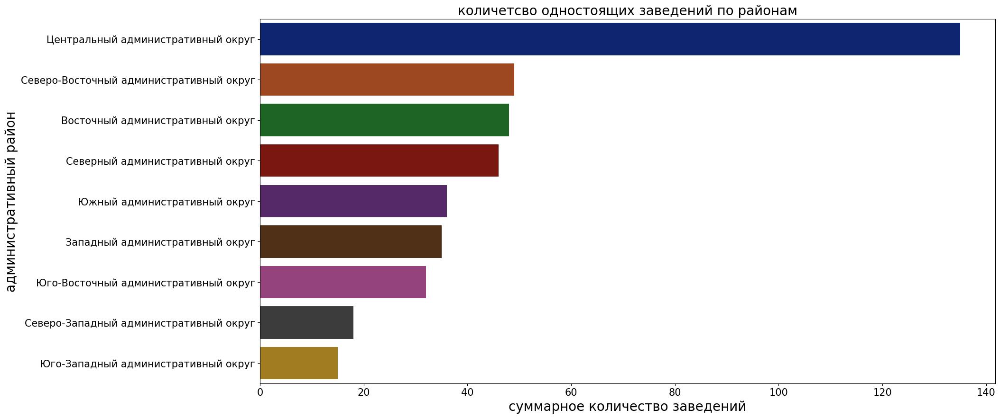

In [77]:
plt.figure(figsize = (20,10))
plt.rcParams.update({'font.size': 15})#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(y = one_category['district'], x = one_category['name'], orient = 'h',)#построим столбчатую диаграмму
plt.title('количетсво одностоящих заведений по районам', fontsize = 20) #установим наименование графика 
plt.xlabel("суммарное количество заведений", fontsize = 20) #установим наименование оси x
plt.ylabel('административный район', fontsize = 20) #установим наименование оси y
plt.show;

Вывод:  
    - Наибольшее количество одностоящих заведений относится к категории кафе, наименьшее количетсов к категории булочная;    
    - Большинство одностоящих заведений расположены в Центральном административном округе, наименьшее количество в Юго-Западном округе

#### Анализ среднего чека

Рассчитаем медианный средний чек по административным районам города Москвы:

In [78]:
bill_median = data.groupby('district', as_index = False) \
.agg({'middle_avg_bill': 'median'}) \
.sort_values(by ='middle_avg_bill', ascending = False)
bill_median #выведим значения

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Выведим значения медианного среднего чека на карту

In [79]:
map_moscow_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_geo,
    data=bill_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(map_moscow_bill)
map_moscow_bill

Вывод: Значения медианы среднего чека наиболее высоки в Центральном административном округе и западном административном округе.  
Наименьшие значения среднего чека в Северо-Восточном, Южном и Юго-Восточном административном округе. 

#### Вывод:
**Проанализировав данные о заведениях города Москвы, получили следующие наблюдения**: 
1. Предасталены следующие категории заведений :кафе, ресторан, кофейня, пиццерия, бар,паб, быстрое питание, булочная, столовая; 
2. Наибольшее количество заведений категории кафе(28% от общего количества), наименшее количество заведений типа булочная (3%); 
3. Наибольшее суммарное количество мест имеют заведения категории ресторан, наименьшее суммарное количество мест имеют булочные;
   По среднему количеству мест на заведение лидирует категория бар, паб; на последнем месте булочные
4. Больше всего сетевых заведений в категории булочная, меньше всего в категории бар, паб .  
5. ТОП-15 сетевых заведений относятся к категориям: пиццерия, кофейня, ресторан, кафе, булочная.
6. Наибольшее количество заведений расположено в Центральном административном округе; наименьшее количество в Северо-Западном округе; В Центральном округе самая популярная категория: бар, паб. В остальных районах ресторан и кофейня.
7. Разброс медианного рейтинга заведений не сильно разнится и лежит в диапазоне от 4 до 4.5.
8. Самый высокий медианный рейтинг заведений в Центральном округе, наименьший в Северо-Восточном и Юго-Восточном округах.
9. Наибольшее количество заведений находится на проспекте Мира. Самое популярная категория кофейня.
10. Район с набольшим медианным средним чеком Центральный, с наименьшим Юго-Восточный.

#### Детализированный анализ категории "Кофейня"

In [80]:
coffeshop = data[data["category"] == "кофейня"] #отберем только кофейни 

In [81]:
f'количество кофеен в Московском регионе:{coffeshop["name"].count()}'#посчитаем количество кофеен в москве 

'количество кофеен в Московском регионе:1413'

In [82]:
coffeshop_district = coffeshop.groupby('district', as_index = False) \
.agg({'name':'count'}) \
.sort_values(by = 'name', ascending = False)

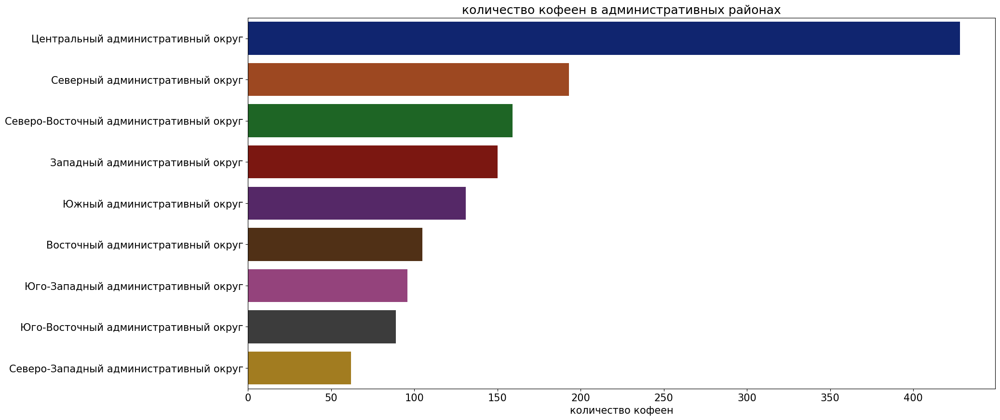

In [83]:
plt.figure(figsize = (20,10))#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(x = 'name', y = 'district', data = coffeshop_district, orientation = 'horizontal')#построим столбчатую диаграмму
plt.title('количество кофеен в административных районах') #установим наименование графика 
plt.xlabel('количество кофеен') #установим наименование оси x
plt.ylabel("") #установим наименование оси y
plt.show;

In [84]:
map_moscow_coffeshop = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_geo,
    data=coffeshop_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='количество кофеен в адиминистративном районе',
).add_to(map_moscow_coffeshop)
map_moscow_coffeshop

Вывод: Наибольшее количество кофеен расположено в Центральном округе. На втором месте Северный округ с почти в два раза меньшим количеством. Меньше всего кофеен в Юго-Западном, Юго-Восточном и Североз-Западном округах.

In [85]:
coffeshop_open24 = data.query('is_24_7 == True and category == "кофейня"')
f'количество круглосуточных кофеен:{coffeshop_open24.shape[0]}'

'количество круглосуточных кофеен:59'

In [86]:
coffeshop_open24

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,<NA>,<NA>,1,20,дмитровское шоссе,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,<NA>,<NA>,1,25,ярославское шоссе,True
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,<NA>,170,1,<NA>,ярославское шоссе,True
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,<NA>,<NA>,1,<NA>,NaN,True
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750,<NA>,1,200,улица народного ополчения,True
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,<NA>,285,1,<NA>,ленинградский проспект,True
1790,кофемания,кофейня,"москва, ленинградский проспект, 37а, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,<NA>,<NA>,1,15,ленинградский проспект,True
1825,you&coffee,кофейня,"москва, улица золоторожский вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,<NA>,<NA>,1,<NA>,улица золоторожский вал,True
1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000,<NA>,1,140,лесная улица,True
2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,<NA>,<NA>,1,230,долгоруковская улица,True


Посмотрим количество круглосуточных кофеен в административных районах.

In [87]:
coffeshop_open24 = coffeshop_open24.groupby('district', as_index = False) \
.agg({'name':'count'}) \
.sort_values(by = 'name', ascending = False)

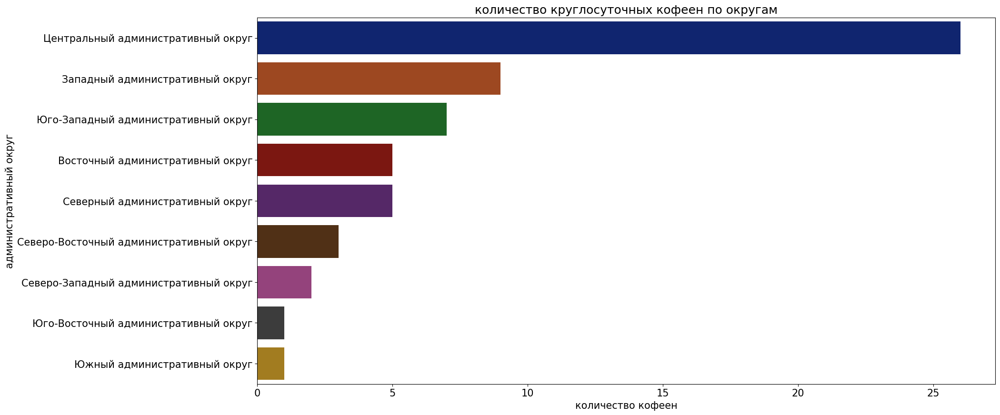

In [88]:
plt.figure(figsize = (20,10))#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(x = 'name', y = 'district', data = coffeshop_open24, orientation = 'horizontal')#построим столбчатую диаграмму
plt.title('количество круглосуточных кофеен по округам') #установим наименование графика 
plt.xlabel("количество кофеен") #установим наименование оси x
plt.ylabel("административный округ") #установим наименование оси y
plt.show;

Подавяющее количество круглосуточных кофеен находится больше всего в Центральном административном округе;  
Наименьшее количество круглосуточных кофеен находится в Южном и Юго-Восточном административном округе; 

In [89]:
coffeshop_rating = coffeshop.groupby('district', as_index = False) \
.agg({'rating':'mean'}) \
.sort_values(by = 'rating', ascending = False)

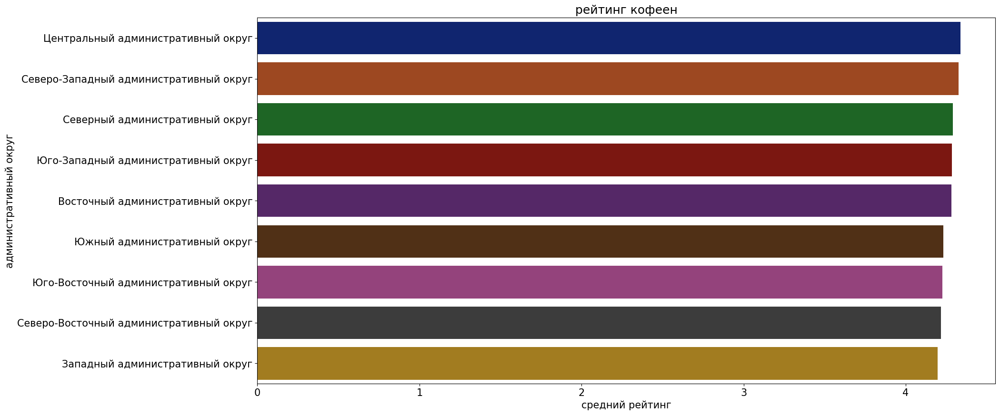

In [90]:
plt.figure(figsize = (20,10))#зададим размер графика 
sns.set_palette('dark')  #выберим стиль графика
sns.barplot(x = 'rating', y = 'district', data = coffeshop_rating, orientation = 'horizontal')#построим столбчатую диаграмму
plt.title('рейтинг кофеен') #установим наименование графика 
plt.xlabel("средний рейтинг") #установим наименование оси x
plt.ylabel("административный округ") #установим наименование оси y
plt.show;

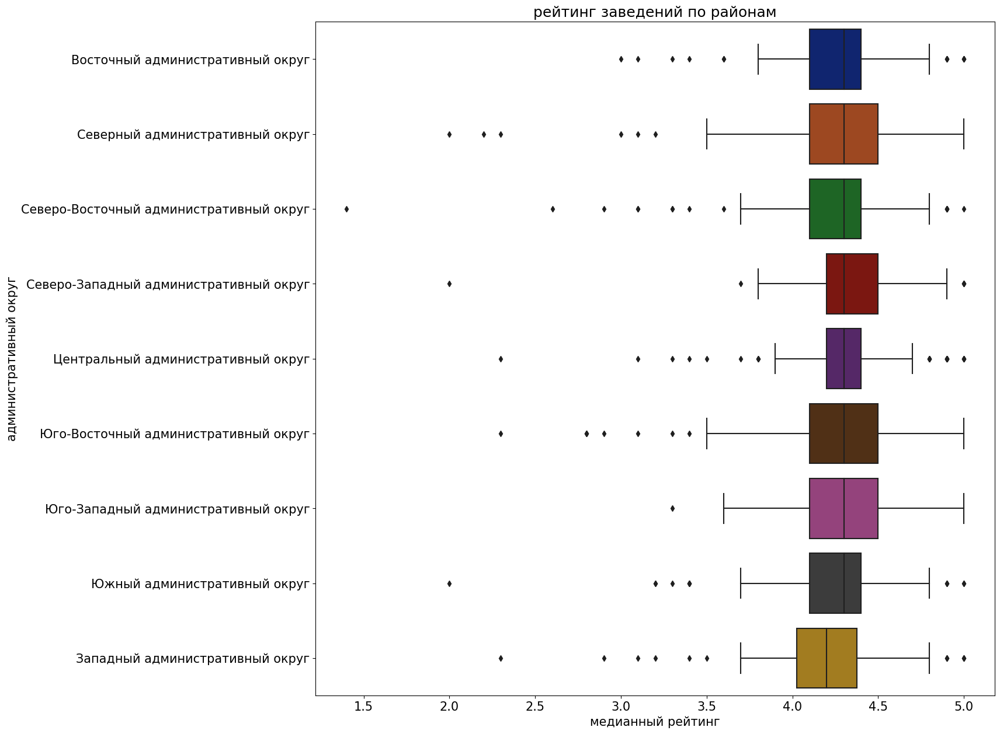

In [91]:
plt.figure(figsize = (15,15))
sns.boxplot(data = coffeshop, x = 'rating', y = 'district', orient = 'h',
order=coffeshop.groupby('district')['rating'].agg('median').sort_values(ascending=False).index)
plt.title('рейтинг заведений по районам') #установим наименование графика 
plt.xlabel("медианный рейтинг") #установим наименование оси x
plt.ylabel("административный округ") #установим наименование оси y
plt.show()

 - В целом по всем административным округам средний рейтинг находится выше 4.Тем не менее у кофеен Центрального округа наибольший  средний рейтинг, у кофеен Западного округа наименьший средний рейтинг;  
 - Медианный рейтинг кофеен лежит в переделах от 4 до 4.5. Наибольший медианный рейтинг у кофеен Восточного административного округа, наименьший медианный рейтинг у кофеен Западного административного округа.
В целом следует ориентироваться на медианные значания, так как по всем районам наблюдаются значительные граничные вбросы.

In [92]:
map_moscow_coffeshop_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_geo,
    data=coffeshop_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='количество кофеен в адиминистративном районе',
).add_to(map_moscow_coffeshop_rating)
map_moscow_coffeshop_rating

In [93]:
f'медианная цена чашки кофе в москве составляет {coffeshop["middle_coffee_cup"].median().round()}'

'медианная цена чашки кофе в москве составляет 170.0'

In [94]:
med_price_coffe = coffeshop.groupby('district', as_index = False).agg({'middle_coffee_cup':'median'})

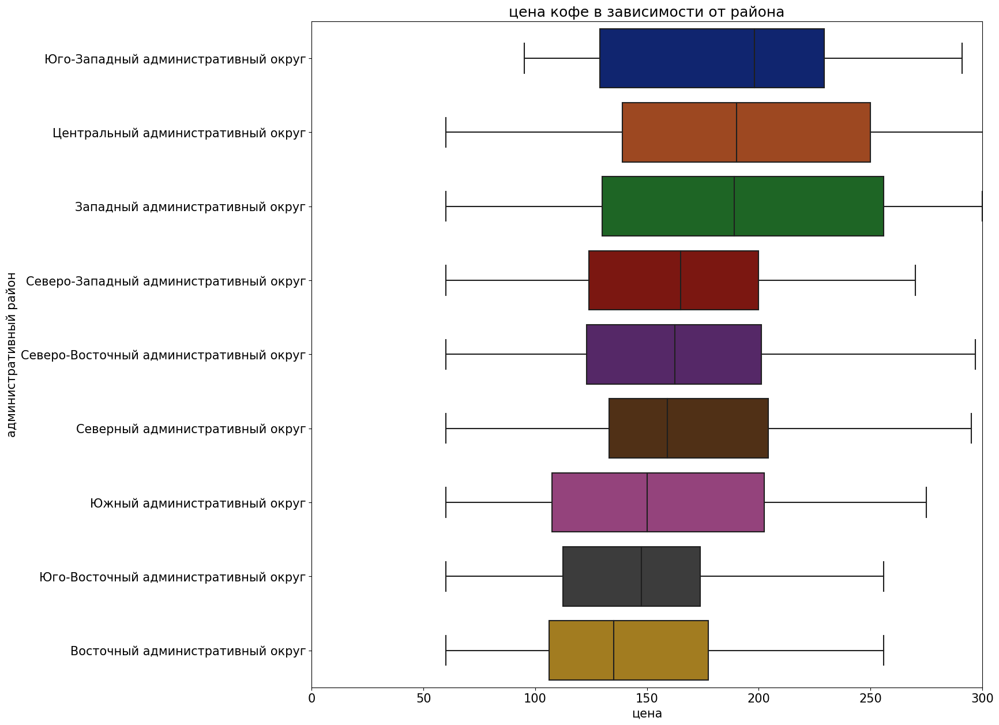

In [95]:
plt.figure(figsize = (15,15))
axes = plt.axes()
sns.boxplot(data = coffeshop, x = 'middle_coffee_cup', y = 'district' , orient = 'h',
order=coffeshop.groupby('district')['middle_coffee_cup'].agg('median').sort_values(ascending=False).index)
axes.set_xlim([0, 300])
plt.title('цена кофе в зависимости от района') #установим наименование графика 
plt.xlabel("цена") #установим наименование оси x
plt.ylabel("административный район") #установим наименование оси y
plt.show()

Медианная цена кофе в Москве в целом составляет 170.  
- Наибольшая медианная цена кофе в кофейнях Юго-Западного административного округа;
- Наименьшая медианная цена кофе в кофейнях Восточного административного округа;


Вывод:   
    **Общие рекомендации к открытию кофейни**:
  - Наиболее подходящим для открытия кофейни будет северо-западный административный округ, так как там наименьшее количество кофеен и соответветсвенно меньше конкуренция на начальном этапе. Северо-Западный район стоит на предпоследнем месте по количеству одностоящих заведений, а значит имеется большое количество торговых центров, для снятия помещений с большей проходимостью. округ имеет третье место с конца по количество круглосуточных кофеен, а значит меньше перехвата посетителей в утрение часы. Округ входит в четверку окургов с лушими медианными рейтингами кофеен, что может привлечь поситителей в выходные или вечерние часы в округ. Округ имеет медианную цену ниже среднемосковской и находится в середине рейтинга, что тоже способствует притоку поситителей в вечерние и выходные дни. Среднюю цену чашки кофе при открытии стоит установить в районе медианной цены по району (~150).

### **Общий вывод**:
 Мы проанализировали рынок общественных заведений москвы и сделали следующие выводы:
1. Предасталены следующие категории заведений :кафе, ресторан, кофейня, пиццерия, бар,паб, быстрое питание, булочная, столовая; 
2. Наибольшее количество заведений категории кафе(28% от общего количества), наименшее количество заведений типа булочная (3%); 
3. Наибольшее суммарное количество мест имеют заведения категории ресторан, наименьшее суммарное количество мест имеют булочные;
   По среднему количеству мест на заведение лидирует категория бар, паб; на последнем месте булочные
4. Больше всего сетевых заведений в категории булочная, меньше всего в категории бар, паб .  
5. ТОП-15 сетевых заведений относятся к категориям: пиццерия, кофейня, ресторан, кафе, булочная.
6. Наибольшее количество заведений расположено в Центральном административном округе; наименьшее количество в Северо-Западном округе; В Центральном округе самая популярная категория: бар, паб. В остальных районах ресторан и кофейня.
7. Разброс медианного рейтинга заведений не сильно разнится и лежит в диапазоне от 4 до 4.5.
8. Самый высокий медианный рейтинг заведений в Центральном округе, наименьший в Северо-Восточном и Юго-Восточном округах.
9. Наибольшее количество заведений находится на проспекте Мира. Самое популярная категория кофейня.
10. Район с набольшим средним чеком Центральный, с наименьшим Юго-Восточный.  

При детальном анализе категории "Кофейня" сделали следующие наблюдения: 
1. количество кофеен в Московском регионе:1413;
2. Наибольшее количество кофеен расположено в Центральном округе. На втором месте Северный округ с почти в два раза меньшим количеством. Меньше всего кофеен в Юго-Западном, Юго-Восточном и Североз-Западном округах.
3. количество круглосуточных кофеен в москве :59;
4. Подавяющее количество круглосуточных кофеен находится больше всего в Центральном административном округе;  
   Наименьшее количество круглосуточных кофеен находится в Южном и Юго-Восточном административном округе;
5.  Медианный рейтинг кофеен лежит в переделах от 4 до 4.5. Наибольший медианный рейтинг у кофеен Восточного административного округа, наименьший медианный рейтинг у кофеен Западного административного округа;
6.  Медианный рейтинг кофеен лежит в переделах от 4 до 4.5. Наибольший медианный рейтинг у кофеен Восточного административного округа, наименьший медианный рейтинг у кофеен Западного административного округа;
7. Медианная цена чашки кофе в Москве составляет 170;
8. Наибольшая медианная цена кофе в кофейнях Юго-Западного административного округа; 
   Наименьшая медианная цена кофе в кофейнях Восточного административного округа.  
   
Рекомендации по открытию кофейни:   
Лучшим районом для открытия некруглосуточной кофейни будет Северо-Западный административный округ, с медаинной ценой чашки кофе ~ 150;

презентация: https://disk.yandex.ru/i/mX5DgNnE_fUBMA